## Aquarium animal detection

Using a zero-shot method baed on the [HuggingFace tutorial](https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection)

In [1]:
import numpy as np 
import pandas as pd

### Load the data

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames[:5]:
        print(os.path.join(dirname, filename))

/kaggle/input/aquarium-dataset/Aquarium Combined/README.dataset.txt
/kaggle/input/aquarium-dataset/Aquarium Combined/README.roboflow.txt
/kaggle/input/aquarium-dataset/Aquarium Combined/valid/IMG_2591_jpeg_jpg.rf.e73e43e7b15118fc1d63787da38e565b.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/valid/IMG_2522_jpeg_jpg.rf.fe97228c0f9f15d425a80236b522307b.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/valid/IMG_2492_jpeg_jpg.rf.7fdeedc3c5005ba50a3295f08f0b54d5.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/valid/IMG_3124_jpeg_jpg.rf.539a07bdc20ae24c50d185c747476b94.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/valid/IMG_2645_jpeg_jpg.rf.95466fb2ccc8118fbd346f305b7d4319.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/test/IMG_2473_jpeg_jpg.rf.6284677f9c781b0cfeec54981a17d573.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/test/IMG_3134_jpeg_jpg.rf.50750ca778773042a3c46a1d3e480132.jpg
/kaggle/input/aquarium-dataset/Aquarium Combined/test/IMG_2387_jpeg_jpg.rf

In [3]:
import glob

train_images = []
for file in glob.glob("/kaggle/input/aquarium-dataset/Aquarium Combined/train/*.jpg"):
    train_images.append(file)
print(train_images[:3])

['/kaggle/input/aquarium-dataset/Aquarium Combined/train/IMG_2578_jpeg_jpg.rf.63adda94658b934843ed3ab53fb52b7d.jpg', '/kaggle/input/aquarium-dataset/Aquarium Combined/train/IMG_2322_jpeg_jpg.rf.5cfbfdaf229269a0def35f967002aee3.jpg', '/kaggle/input/aquarium-dataset/Aquarium Combined/train/IMG_8495_jpg.rf.207e20fe66feab6da48e9bbf2e9aeb83.jpg']


### Load the model

In [4]:
from transformers import pipeline

checkpoint = "google/owlv2-base-patch16-ensemble"
detector = pipeline(model=checkpoint, task="zero-shot-object-detection")

2025-06-02 14:25:25.155335: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748874325.354245      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748874325.411346      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


config.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/620M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.10k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/67.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/425 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda:0


Let's check out an example image from the dataset

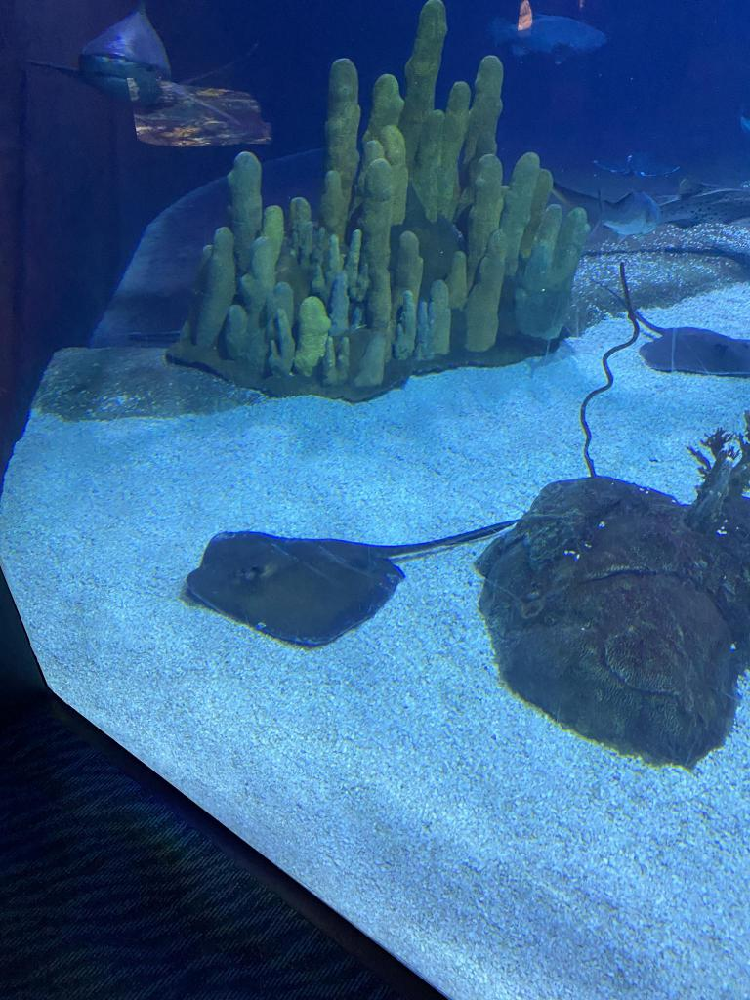

In [5]:
from PIL import Image

example_image = Image.open(train_images[0])
example_image

In [6]:
# Classes provided in the dataset description
predefined_classes = [
    "fish",
    "stingray",
    "jellyfish",
    "penguin",
    "shark",
    "puffin",
    "starfish"]

In [7]:
predictions = detector(
    example_image,
    candidate_labels=predefined_classes,
)

#### Visualizing raw predictions

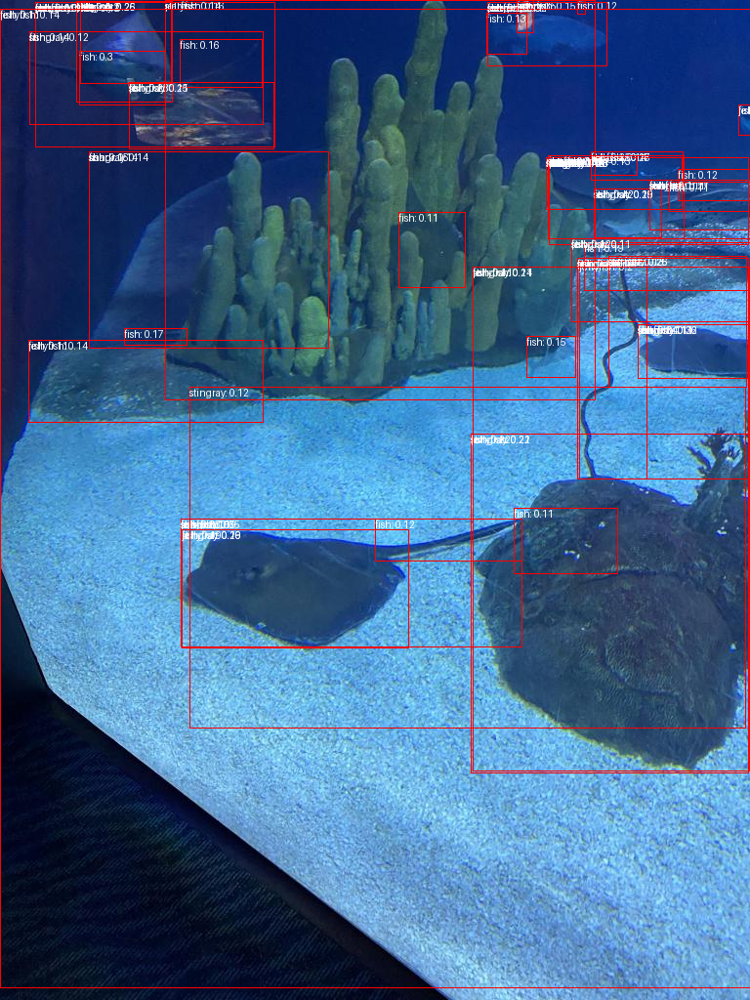

In [8]:
from PIL import ImageDraw
example_image = Image.open(train_images[0])
draw = ImageDraw.Draw(example_image)

for prediction in predictions:
    if prediction["score"]<0.1:
        continue
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

example_image

### Animal detection (without NMS)

We can see that there are a lot of predicted objects, including false positives

Let's define a function that will load an image, make predictions, and filter to top n most confident labels before annotating the image

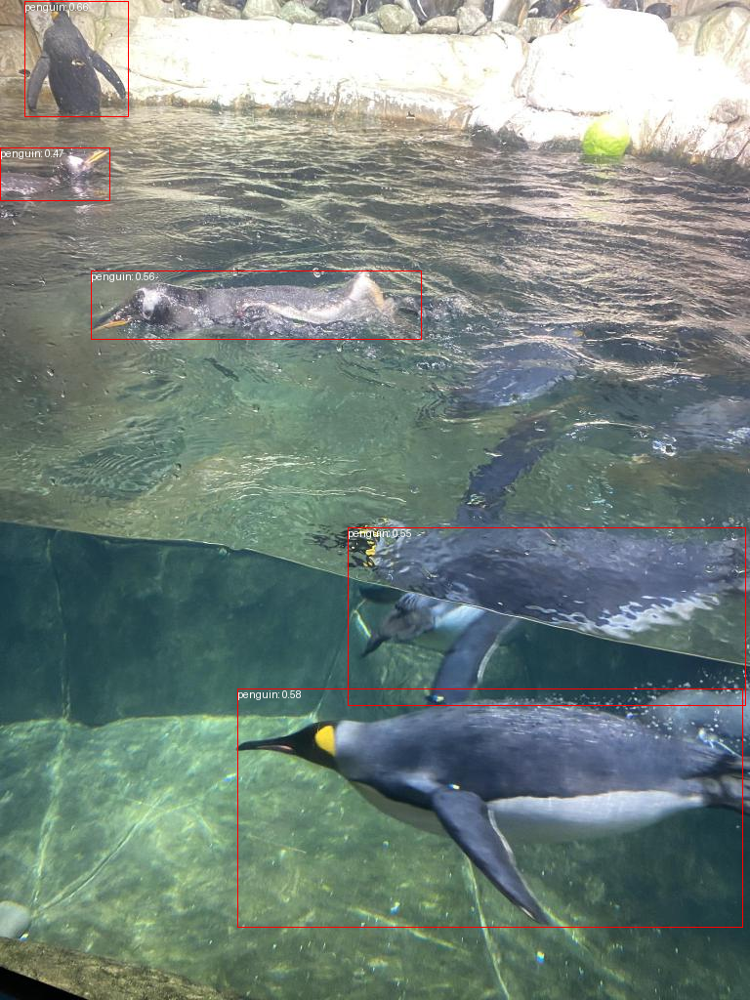

In [9]:
from collections.abc import Sequence

def annotate_image(filepath: str, custom_classes: Sequence, top_n: None | int = None):
    im = Image.open(filepath)
    predictions = detector(
        im,
        candidate_labels=custom_classes,
    )
    draw = ImageDraw.Draw(im)
    
    preds = sorted(predictions, reverse=True, key = lambda x: x["score"])
    if top_n is not None:
        preds = preds[:top_n]
    for prediction in preds:
        box = prediction["box"]
        label = prediction["label"]
        score = prediction["score"]
    
        xmin, ymin, xmax, ymax = box.values()
        draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
        draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")
    
    return im

annotate_image(train_images[1], custom_classes=predefined_classes, top_n=5)

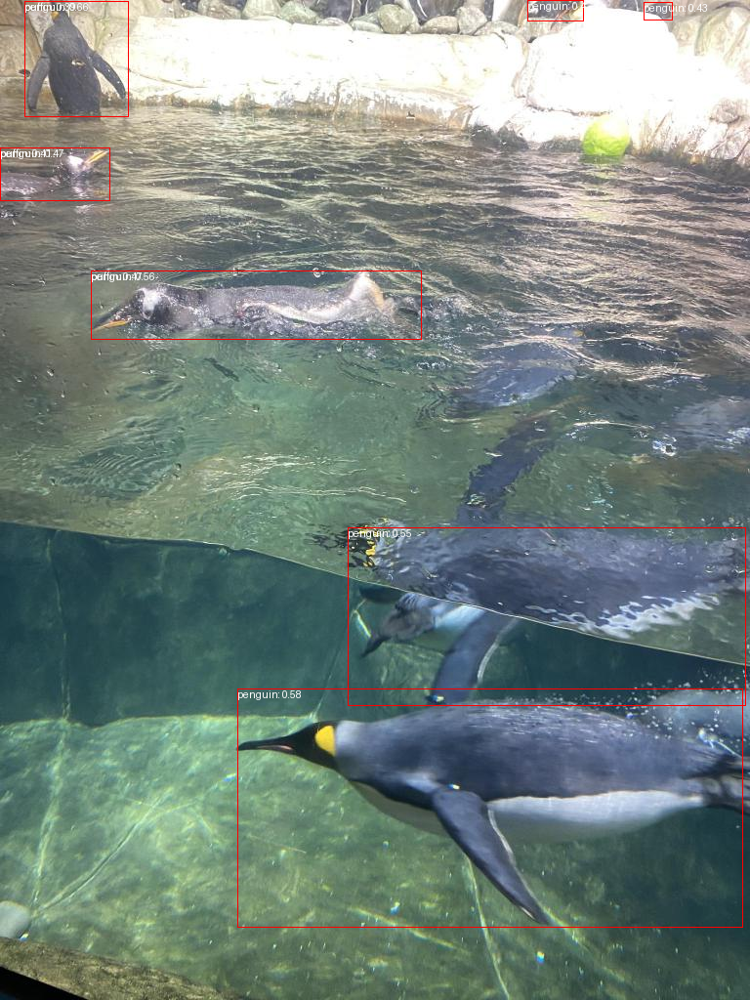

In [10]:
annotate_image(train_images[1], custom_classes=predefined_classes, top_n=10)

We can see that filtering to top results gives quite nice results; without filtering we get a lot of noise:

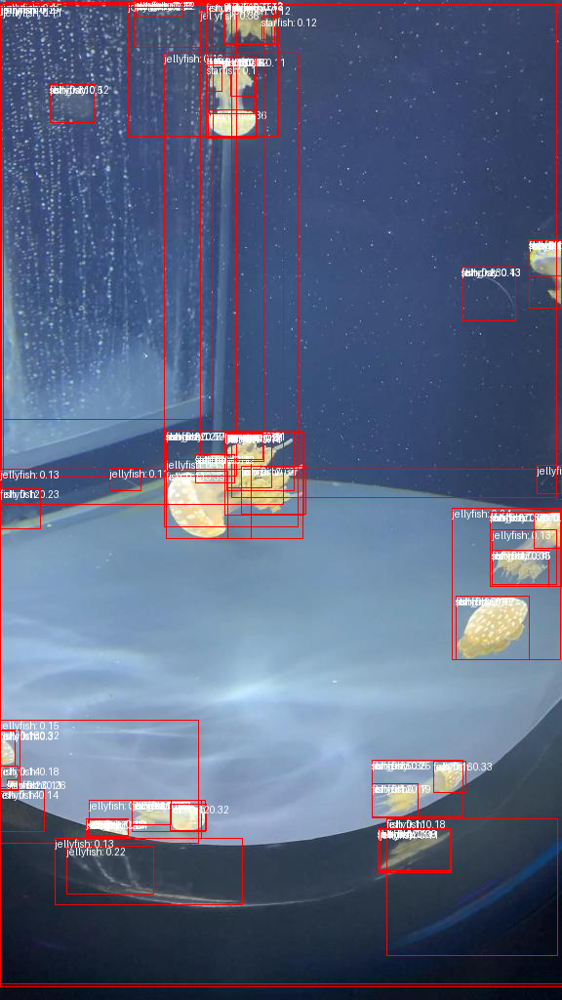

In [11]:
annotate_image(train_images[25], custom_classes=predefined_classes)

And after filtering to top 10 labels we get a nicely labelled image:

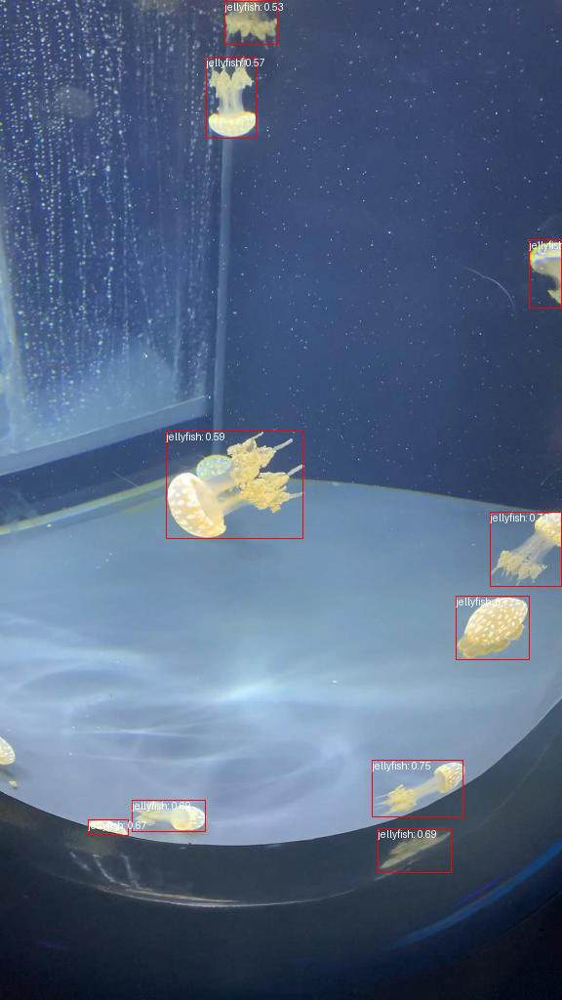

In [12]:
annotate_image(train_images[25], custom_classes=predefined_classes, top_n=10)

^ Although one should note the reflected jellyfish in the bottom right corner that was also detected

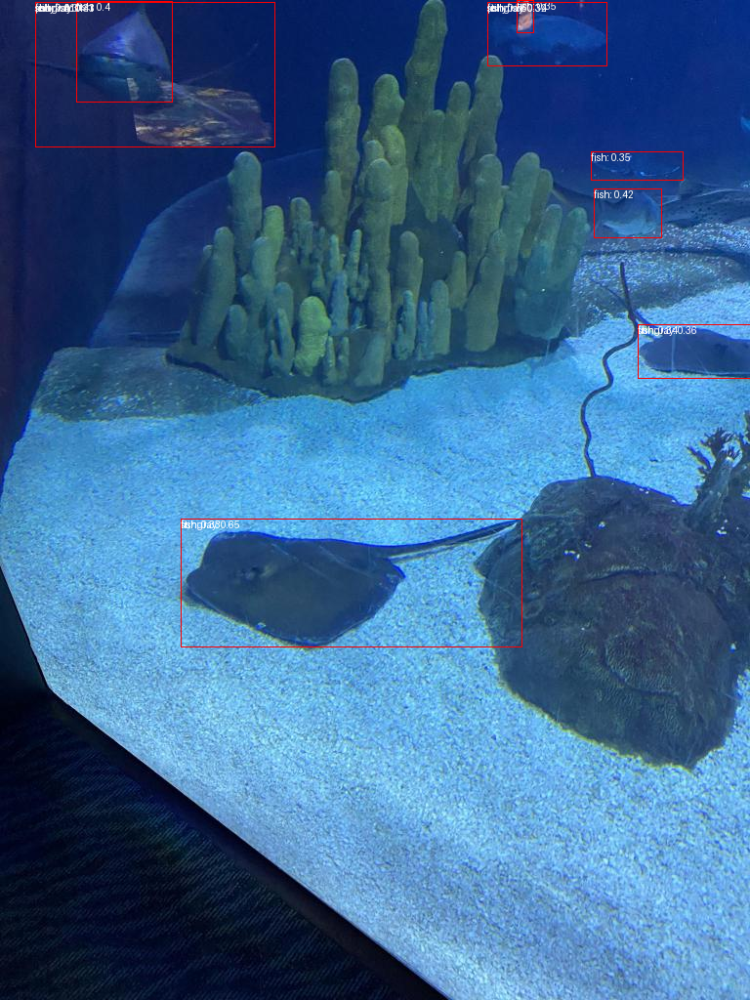

In [13]:
annotate_image(train_images[0], custom_classes=predefined_classes, top_n=15)

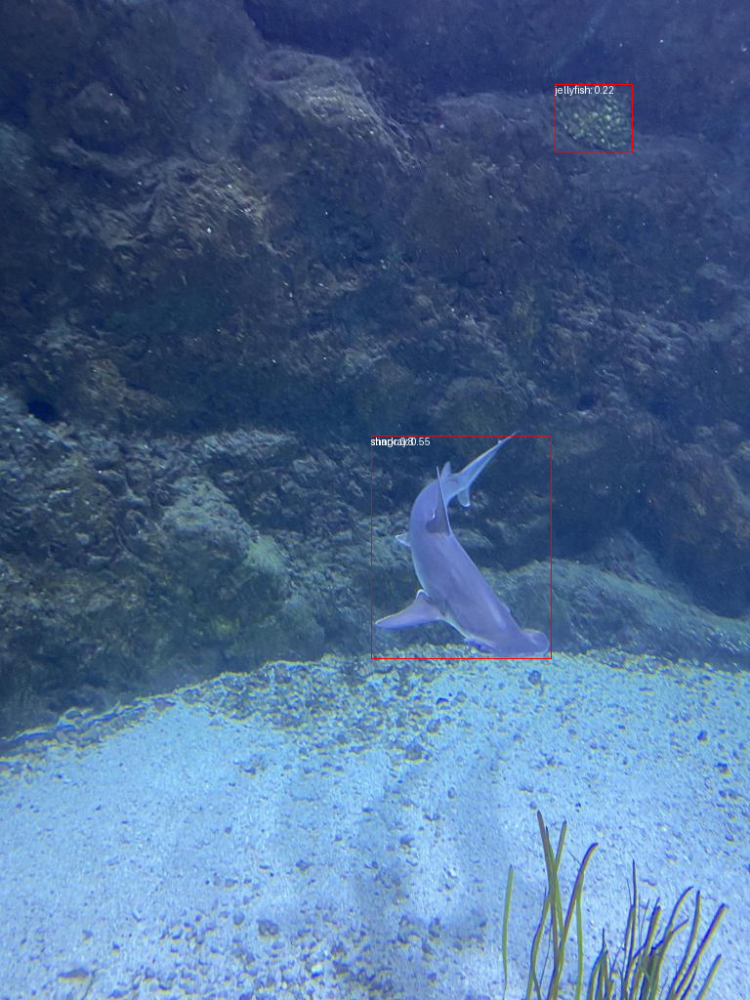

In [14]:
annotate_image(train_images[50], custom_classes=predefined_classes, top_n=3)

Oddly enough in this dataset a shark is not a subcategory of fish, so putting the class names as is into the model sometimes gives a bit confusing results, as above

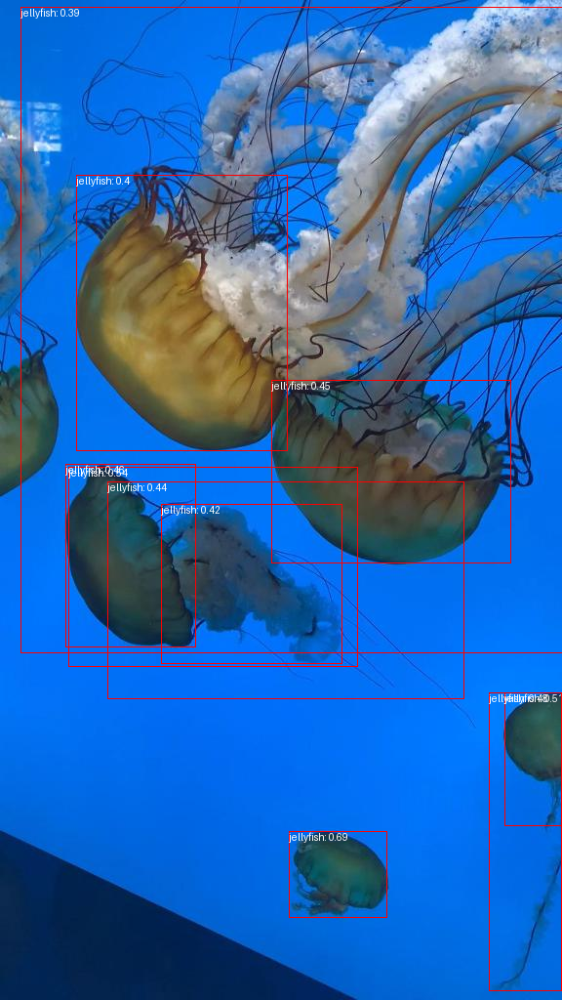

In [15]:
annotate_image(train_images[75], custom_classes=predefined_classes, top_n=10)

### Non-max suppression

To better filter the bounding boxes (instead of using a **very** crude heuristic), we can use Non-Max Suppression

This allows us to consider both the confidence score of each detected object and its overlap with other detections - thus reducing the number of duplicates (like the jellyfish detected multiple times in the middle of the photo above)

In [22]:
from transformers import Owlv2Processor, Owlv2ForObjectDetection

if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

processor = Owlv2Processor.from_pretrained("google/owlv2-base-patch16-ensemble")
model = Owlv2ForObjectDetection.from_pretrained("google/owlv2-base-patch16-ensemble", device_map=device)

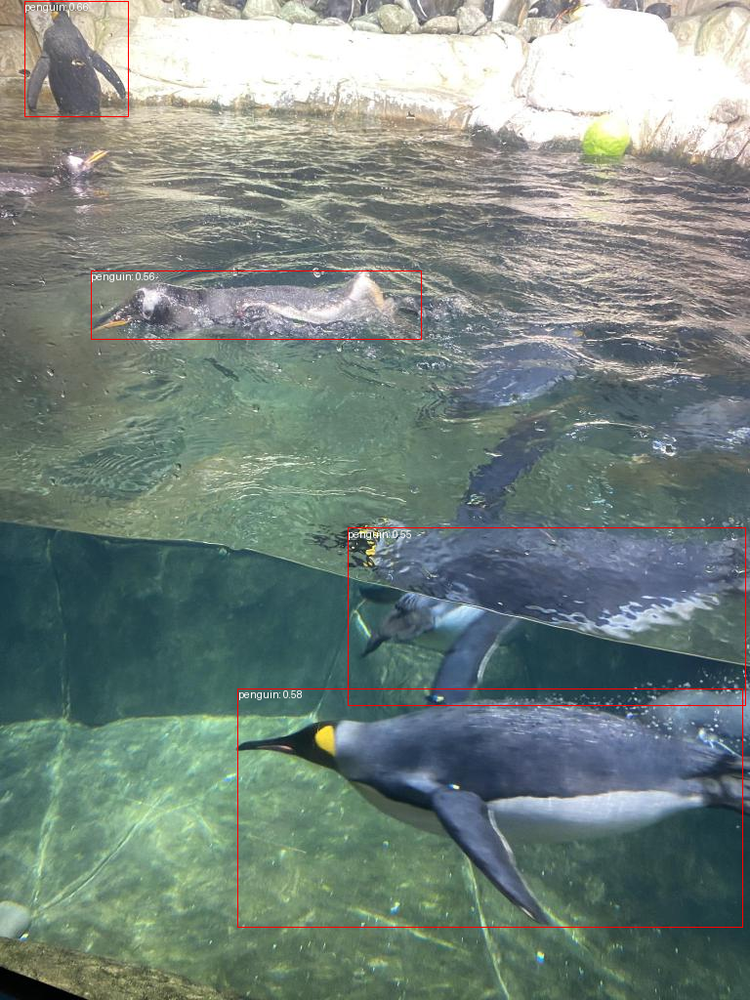

In [23]:
import torch
from collections.abc import Sequence
from PIL import ImageDraw
from torchvision.ops import nms

def nms_annotate_image(filepath: str, custom_classes: Sequence, confidence_threshold=0.5, nms_threshold=0.5):
    im = Image.open(filepath)
    with torch.no_grad():
        inputs = processor(text=[custom_classes], images=im, return_tensors="pt").to(device)
        outputs = model(**inputs)
        target_sizes = torch.tensor([(im.height, im.width)])
        results = processor.post_process_grounded_object_detection(
            outputs=outputs, target_sizes=target_sizes, threshold=confidence_threshold, text_labels=[custom_classes]
        )
    result = results[0]
    boxes, scores, text_labels = result["boxes"], result["scores"], result["text_labels"]
    
    indices_to_keep = nms(boxes, scores, nms_threshold)
    boxes = boxes[indices_to_keep]
    scores = scores[indices_to_keep]
    text_labels = [text_labels[i] for i in indices_to_keep]
    
    draw = ImageDraw.Draw(im)
    for box, score, label in zip(boxes, scores, text_labels):
        box = [round(i, 2) for i in box.tolist()]
    
        xmin, ymin, xmax, ymax = box
        draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
        draw.text((xmin, ymin), f"{label}: {round(score.detach().item(),2)}", fill="white")
    
    return im

nms_annotate_image(train_images[1], custom_classes=predefined_classes)

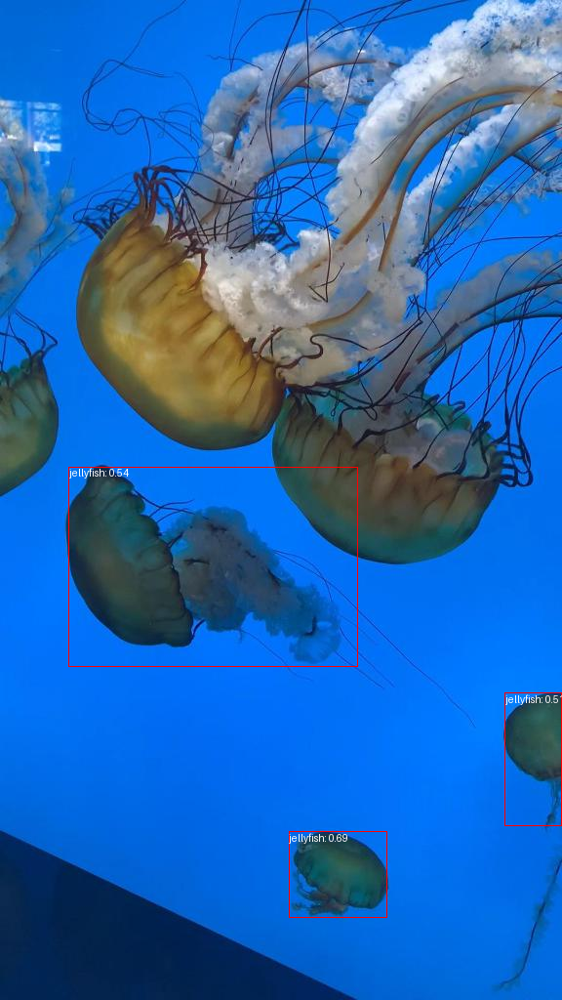

In [24]:
nms_annotate_image(train_images[75], custom_classes=predefined_classes, confidence_threshold=0.5)

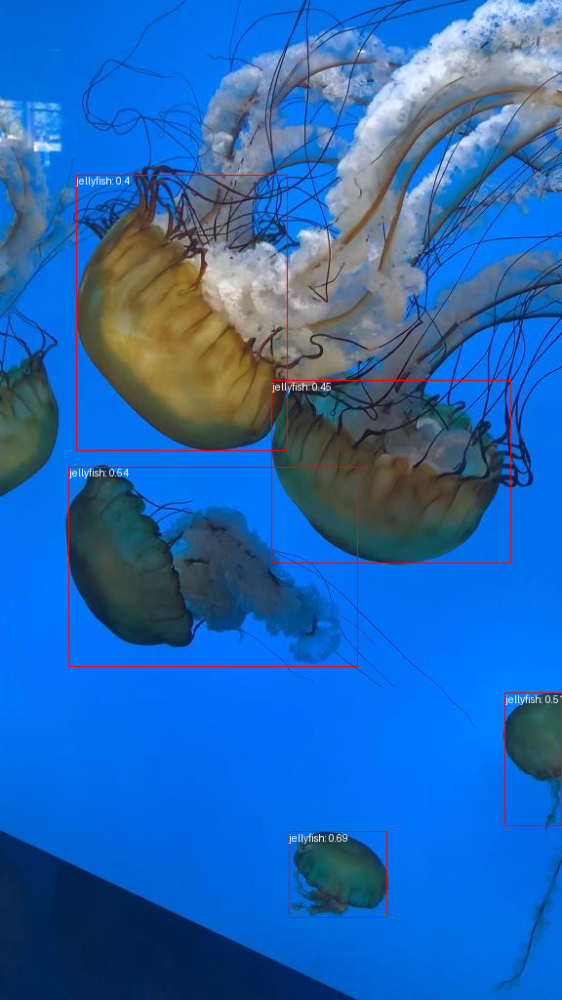

In [25]:
nms_annotate_image(train_images[75], custom_classes=predefined_classes, confidence_threshold=0.4, nms_threshold=0.3)

As ssen above, we can adjust the nms_threshold (which will discard bounding boxes that have too much overlap with others even if their confidence score is high) to filter out false positives.

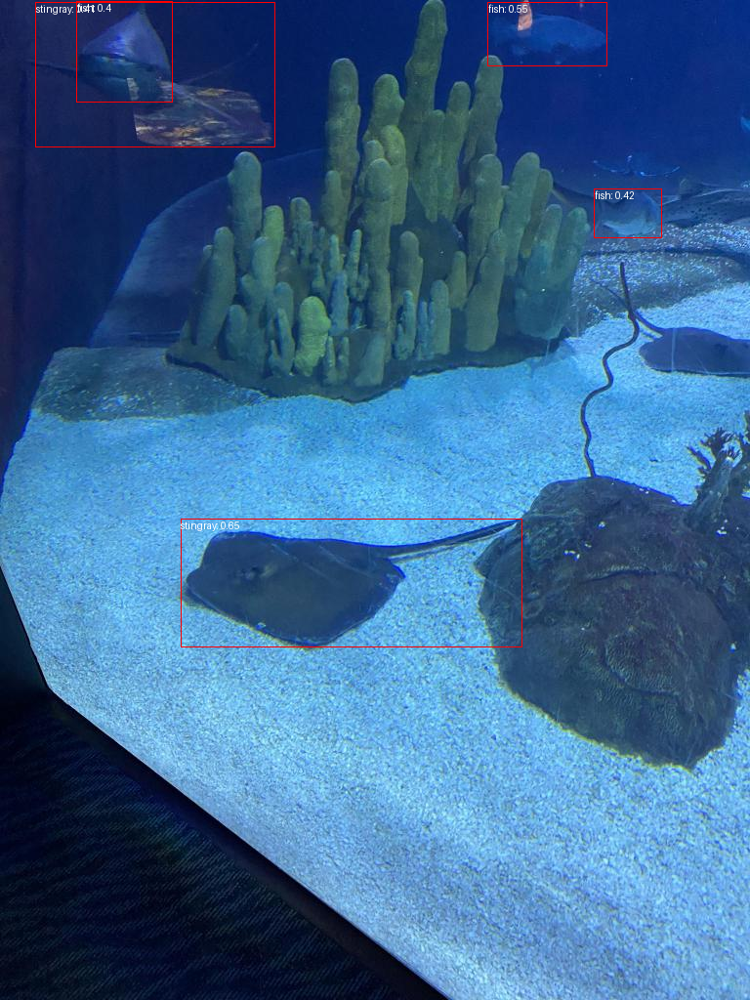

In [26]:
nms_annotate_image(train_images[0], custom_classes=predefined_classes, confidence_threshold=0.4, nms_threshold=0.3)

### Model evaluation using COCOeval & mAP\@0.5

In [31]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

coco_gt = COCO("/kaggle/input/aquarium-dataset/Aquarium Combined/test/_annotations.coco.json") 
category_name_to_id = {cat["name"]: cat["id"] for cat in coco_gt.loadCats(coco_gt.getCatIds())}

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


We'll have to modify our function to not draw on the images and instead append the (filtered) results to a list we'll use later for comparison with the ground truth

In [45]:
import json
import os
import torch
from tqdm import tqdm
from PIL import Image

def run_predictions_on_dataset(image_dir, image_ids, custom_classes, confidence_threshold=0.1, nms_threshold=0.5):
    predictions = []
    for img_id in tqdm(image_ids):
        img_info = coco_gt.loadImgs(img_id)[0]
        image_path = os.path.join(image_dir, img_info["file_name"])
        image = Image.open(image_path).convert("RGB")
        
        inputs = processor(text=[custom_classes], images=image, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)
        
        target_sizes = torch.tensor([(image.height, image.width)]).to(device)
        results = processor.post_process_grounded_object_detection(
            outputs=outputs,
            target_sizes=target_sizes,
            threshold=confidence_threshold,
            text_labels=[custom_classes]
        )[0]
        
        boxes, scores, labels = results["boxes"], results["scores"], results["text_labels"]
        keep = torch.ops.torchvision.nms(boxes, scores, nms_threshold)

        for i in keep:
            label_str = labels[i]
            if label_str not in category_name_to_id:
                continue  # Skip unknown class
            box = boxes[i].tolist()
            xmin, ymin, xmax, ymax = box
            width = xmax - xmin
            height = ymax - ymin

            predictions.append({
                "image_id": img_id,
                "category_id": category_name_to_id[label_str],
                "bbox": [xmin, ymin, width, height],
                "score": scores[i].item()
            })
    
    return predictions


#### Getting the predictions for all test images

In [47]:
test_image_ids = coco_gt.getImgIds()
test_images_dir = "/kaggle/input/aquarium-dataset/Aquarium Combined/test"
# Lower confidence threshold bcause many true positives had low scores
predictions = run_predictions_on_dataset(test_images_dir, test_image_ids, custom_classes=predefined_classes, confidence_threshold=0.1, nms_threshold=0.5)

100%|██████████| 63/63 [00:34<00:00,  1.80it/s]


In [48]:
with open("predictions.json", "w") as f:
    json.dump(predictions, f)

In [49]:
coco_dt = coco_gt.loadRes("predictions.json")

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!


### Evaluation results

In [50]:
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.params.iouThrs = [0.5]  # mAP@0.5
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.10s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.50 | area=   all | maxDets=100 ] = 0.621
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.50 | area= small | maxDets=100 ] = 0.359
 Average Precision  (AP) @[ IoU=0.50:0.50 | area=medium | maxDets=100 ] = 0.663
 Average Precision  (AP) @[ IoU=0.50:0.50 | area= large | maxDets=100 ] = 0.621
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxDets=  1 ] = 0.203
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxDets= 10 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxDets=100 ] = 0.767
 Average Recall     (AR) @[ IoU=0.50:0.50 | area= small | maxDets=100 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=medium | maxDets=1

So our mAP\@0.5 is equal to 0.621

Meanwhile mAR\@0.5 is 0.767

For better results, we could adjust the (NMS / score) thresholds using a validation set and then test the model again to see if the results will be better